# EP2 MAC0417 - PARTE 1
**Nome:** Gabriela Victor

**NUSP:** 11795381

*Objetivo: Ler a base de dados criada anteriormente e visualizá-la em forma de uma tabela sumária de dados. Criar biblioteca de funções
de Data Augmentation na base de dados.

In [ ]:
# @title
### EP2 MAC0417 / MAC5768 ##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. # # TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM # # DESONESTIDADE ACADÊMICA OU PLÁGIO. #
## # DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS # # DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E # # DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. # ## # ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR # # DESONESTIDADE ACADÊMICA. #
## ##
# Nome: Gabriela Victor #
# NUSP: 11795381 #
# Turma: MAC0417 145    #
# Prof.: Ronaldo Fumio Hashimoto #
##################################################################

Importação bibliotecas necessárias.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import matplotlib.image as mpimg
import pandas as pd
import os
import cv2

In [2]:
!git clone https://github.com/gabriela-vic/EP1


Cloning into 'EP1'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 131 (delta 7), reused 31 (delta 5), pack-reused 94
Receiving objects: 100% (131/131), 226.12 MiB | 31.22 MiB/s, done.
Resolving deltas: 100% (7/7), done.
Updating files: 100% (111/111), done.


In [20]:
os.chdir('EP1')

Diminuição do tamanho das imagens

In [21]:
# essa lista será usada posteriormente para obter o originalGrayDataset
image_files = [f for f in os.listdir('.') if f.endswith('.jpg')]

for image_file in image_files:

    img = cv2.imread(image_file)


    img_redux = cv2.resize(img, (0, 0), fx=0.5, fy=0.5)


    cv2.imwrite(image_file, img_redux)



In [6]:
df = pd.read_csv('metadadoEP1.csv')
print(df.head()) # conferir tabela lida corretamente

  filename  classe1 classe2 classe3    classe4    fundo  iluminação  \
0  001.jpg  perfume   colar   batom  bailarina  madeira   dia-claro   
1  002.jpg  perfume   colar   batom  bailarina  madeira   dia-claro   
2  003.jpg  perfume   colar   batom  bailarina  madeira   dia-claro   
3  004.jpg  perfume   colar   batom  bailarina  madeira  dia-escuro   
4  005.jpg  perfume   colar   batom  bailarina  madeira  dia-escuro   

  tamanho base    resolução  total imagens  
0     481,8 MB  3072 x 4096          108.0  
1          NaN          NaN            NaN  
2          NaN          NaN            NaN  
3          NaN          NaN            NaN  
4          NaN          NaN            NaN  


A partir do arquivo csv contendo os metadados, gerar a tabela sumária.

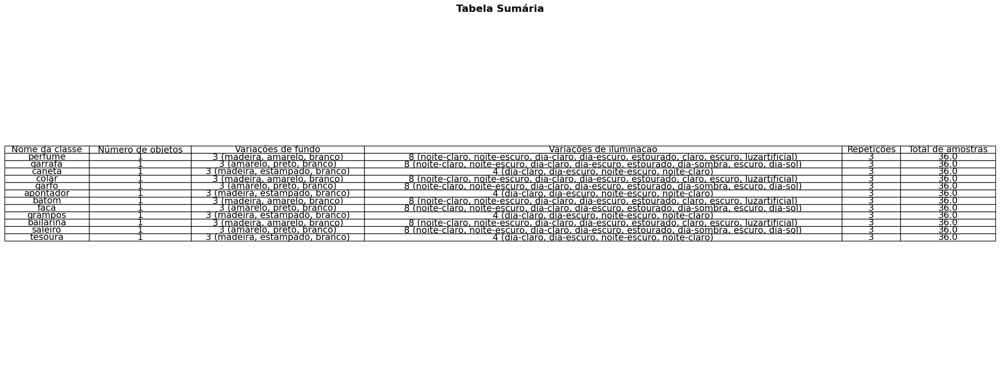

In [7]:
# Obter nomes das classes
classe1_counts = df['classe1'].value_counts()
classe2_counts = df['classe2'].value_counts()
classe3_counts = df['classe3'].value_counts()
classe4_counts = df['classe4'].value_counts()

classes_counts = pd.concat([classe1_counts, classe2_counts, classe3_counts, classe4_counts], axis=1).fillna(0)
classes_counts['total'] = classes_counts.sum(axis=1)


# Obter nomes das variações de fundo e iluminação
# A função recebe umas das classes 1, 2, 3 ou 4 presentes na imagem, o nome da classe e a variação 'fundo' ou iluminação'
# para retornar o nomes das diferentes variações.
def obter_variacoes(df, num_classe, nome_classe, variacao):
    return df[df[num_classe] == nome_classe][variacao].unique()


variacoes_fundo = []
variacoes_iluminacao = []

for classe in classes_counts.index:        # para cada nome de classe
    fundos = set()                         # usamos set() para conjuntos com elementos únicos
    iluminacoes = set()
    for col in ['classe1', 'classe2', 'classe3', 'classe4']:
        fundos.update(obter_variacoes(df, col, classe, 'fundo'))
        iluminacoes.update(obter_variacoes(df, col, classe, 'iluminação'))
    variacoes_fundo.append(f"{len(fundos)} ({', '.join(fundos)})")                # quantidade de variações + nomes
    variacoes_iluminacao.append(f"{len(iluminacoes)} ({', '.join(iluminacoes)})")


# Total de amostras
total_amostras = len(df)

# Criar tabela sumária
tabela_sumaria = pd.DataFrame({
    'Nome da classe': classes_counts.index,
    'Número de objetos': 1,
    'Variações de fundo': variacoes_fundo,
    'Variações de iluminacao': variacoes_iluminacao,
    'Repetições': 3,
    'Total de amostras': classes_counts['total']
})


# Função para exibir a tabela usando matplotlib
def display_table(df, titulo):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.axis('off')
    ax.axis('tight')
    table = ax.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(14)
    table.auto_set_column_width(col=list(range(len(df.columns))))
    plt.subplots_adjust(top=0.85)
    plt.title(titulo, fontsize=16, weight='bold', pad=20)

    plt.show()
display_table(tabela_sumaria, 'Tabela Sumária')

# Função para visualizar uma base de dados

In [22]:

def visualize_dataset(dataset_dir):

    original_dir = os.getcwd()
    print(f"Diretório atual antes de mudar: {original_dir}")

    path = '/content/EP1/'
    path_completo = os.path.join(path, dataset_dir)
    print(f"Caminho completo do dataset: {path_completo}")

    if original_dir != path_completo:
        os.chdir(path_completo)
        print(f"Diretório mudado para: {os.getcwd()}")


    metadado_csv = f"{dataset_dir}.csv"
    print(f"Caminho do arquivo CSV: {metadado_csv}")


    if not os.path.isfile(metadado_csv):
        print(f"Arquivo CSV {metadado_csv} não encontrado.")
        os.chdir(original_dir)
        return


    try:
        metadado = pd.read_csv(metadado_csv)
    except Exception as e:
        print(f"Erro ao carregar o CSV: {e}")
        os.chdir(original_dir)
        return

    colunas_classes = ['classe1', 'classe2', 'classe3', 'classe4']
    fotos_por_classe = {}  # Dicionário para organizar nomes das fotos por classe

    for coluna in colunas_classes:
        for classe in metadado[coluna].unique():
            if classe not in fotos_por_classe:
                fotos_por_classe[classe] = []

    for index, row in metadado.iterrows():
        nome_foto = row['filename']
        for coluna in colunas_classes:
            classe = row[coluna]
            if nome_foto not in fotos_por_classe[classe]:
                fotos_por_classe[classe].append(nome_foto)

    max_images_per_class = 5
    batch_size = 5  # Número de imagens para processar e exibir de cada vez
    subplot_size = (15, 5)  # Tamanho da figura para cada lote

    for classe, fotos in fotos_por_classe.items():
        selected_photos = fotos[:max_images_per_class]

        for i in range(0, len(selected_photos), batch_size):
            plt.figure(figsize=subplot_size)

            for j, photo_name in enumerate(selected_photos[i:i+batch_size]):
                img_path = os.path.join(os.getcwd(), photo_name)
                try:
                    img = mpimg.imread(img_path)
                    ax = plt.subplot(1, batch_size, j+1)
                    ax.imshow(img, aspect='equal')
                    ax.axis('off')
                    if j == 0:
                        ax.set_title(f'Classe: {classe}')
                except Exception as e:
                    print(f"Erro ao carregar a imagem {photo_name}: {e}")

            plt.tight_layout()
            plt.show()
            plt.close()

    # Voltar para o diretório original
    os.chdir(original_dir)
    print(f"Voltou para o diretório original: {original_dir}")




In [23]:
def cria_diretorio(dir):
    if not os.path.exists(dir):
        os.makedirs(dir)

def RGB2gray(image):
  img = cv2.imread(image_file)

  rgb_gray = [0.2989, 0.5870, 0.1140]
  img_gray = np.dot(img, rgb_gray)

  return img_gray.astype(np.uint8)

# Data Augmentation

Implementação de 5 funções:



*   Contrast Stretching
*   Logaritmo da Imagem
*   Exponencial da Imagem
*   Laplaciano da Imagem
*   Filtro da média usando convolução













In [24]:
def contrast_stretching(image):
    min_val = np.percentile(image, 2)
    max_val = np.percentile(image, 98)
    stretched = np.clip((image - min_val) * 255.0 / (max_val - min_val), 0, 255)
    return stretched.astype(np.uint8)


def laplacian(image):
    laplacian_img = cv2.Laplacian(img, cv2.CV_64F)
    abs_laplacian = np.absolute(laplacian_img)
    laplacian_8u = np.uint8(abs_laplacian)
    return laplacian_8u

def mean_filter(image, kernel_size=5):
    mean_filtered = cv2.blur(image, (kernel_size, kernel_size))
    return mean_filtered


def log_transformation(image, c):

    image = np.float32(image)
    log_image = c * np.log(1 + image)
    # Normalizar a imagem para o intervalo [0, 255]
    log_image = cv2.normalize(log_image, None, 0, 255, cv2.NORM_MINMAX)
    return np.uint8(log_image)


def exponential_transformation(image, c, gamma):

    image = np.float32(image)
    exp_image = c * np.power(image, gamma)
    # Normalizar a imagem para o intervalo [0, 255]
    exp_image = cv2.normalize(exp_image, None, 0, 255, cv2.NORM_MINMAX)
    return np.uint8(exp_image)





In [12]:

gray_dataset_dir = 'originalGrayDataSet'
augm_dataset_dir = 'augmentationDataSet'


cria_diretorio(gray_dataset_dir)
cria_diretorio(augm_dataset_dir)
destino = os.path.join("/content/EP1/originalGrayDataSet", "originalGrayDataSet.csv")
df.to_csv(destino, index=False)


for image_file in image_files:

  img = cv2.imread(image_file)
  img_grayscale = RGB2gray(img)
  prefix = 'grayscale'
  output_path = os.path.join(gray_dataset_dir, f"{prefix}_{image_file}")
  cv2.imwrite(output_path, img_grayscale)


dfgray = pd.read_csv(destino)
dfgray['filename'] = dfgray['filename'].apply(lambda x: f"grayscale_{x}")
dfgray.to_csv(destino, index=False)



In [26]:
os.chdir('originalGrayDataSet')


In [27]:
dfgray = pd.read_csv('originalGrayDataSet.csv')

In [28]:
print(dfgray.head())

            filename  classe1 classe2 classe3    classe4    fundo  iluminação  \
0  grayscale_001.jpg  perfume   colar   batom  bailarina  madeira   dia-claro   
1  grayscale_002.jpg  perfume   colar   batom  bailarina  madeira   dia-claro   
2  grayscale_003.jpg  perfume   colar   batom  bailarina  madeira   dia-claro   
3  grayscale_004.jpg  perfume   colar   batom  bailarina  madeira  dia-escuro   
4  grayscale_005.jpg  perfume   colar   batom  bailarina  madeira  dia-escuro   

  tamanho base    resolução  total imagens  
0     481,8 MB  3072 x 4096          108.0  
1          NaN          NaN            NaN  
2          NaN          NaN            NaN  
3          NaN          NaN            NaN  
4          NaN          NaN            NaN  


Diretório atual antes de mudar: /content/EP1/originalGrayDataSet
Caminho completo do dataset: /content/EP1/originalGrayDataSet
Caminho do arquivo CSV: originalGrayDataSet.csv


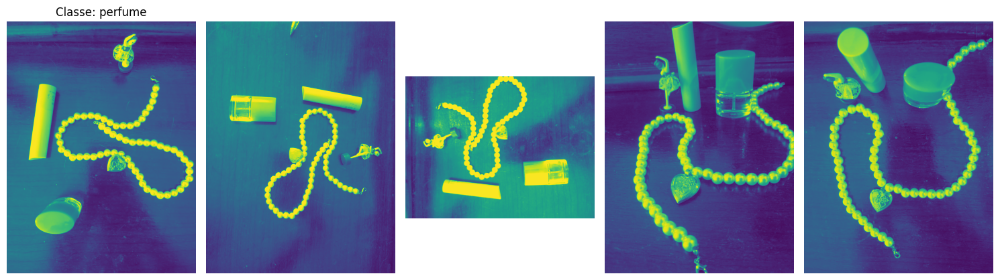

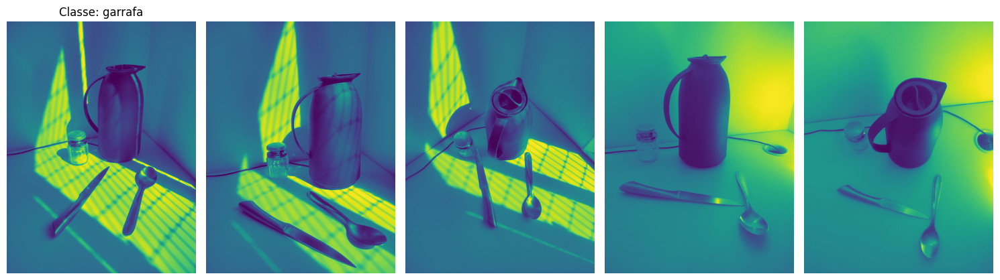

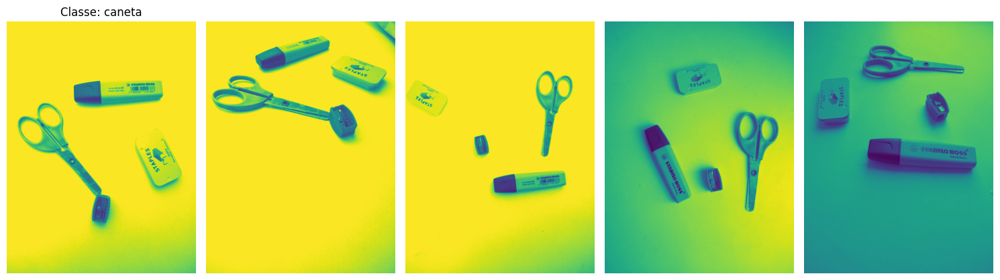

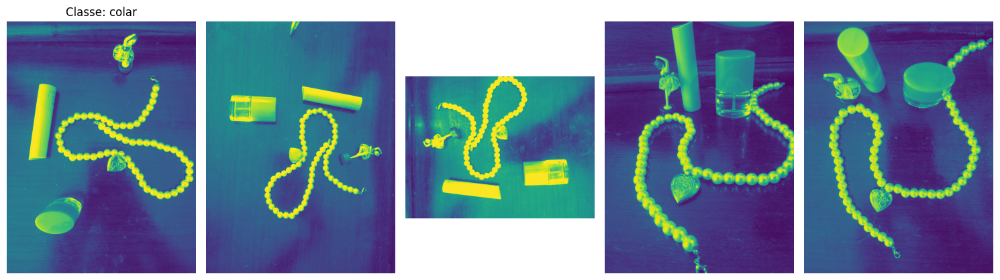

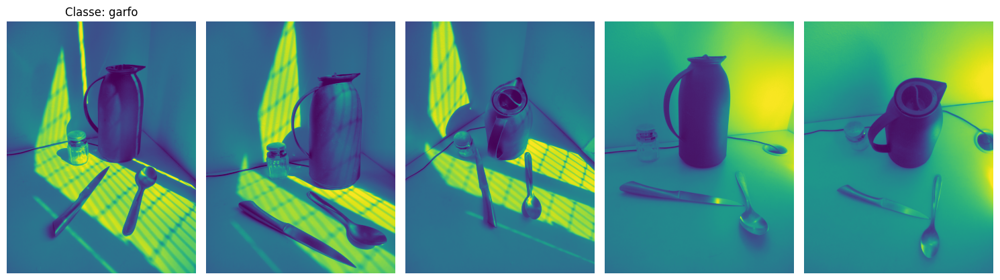

...

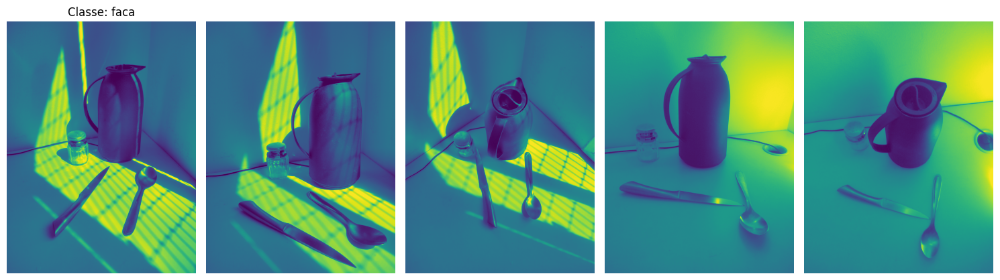

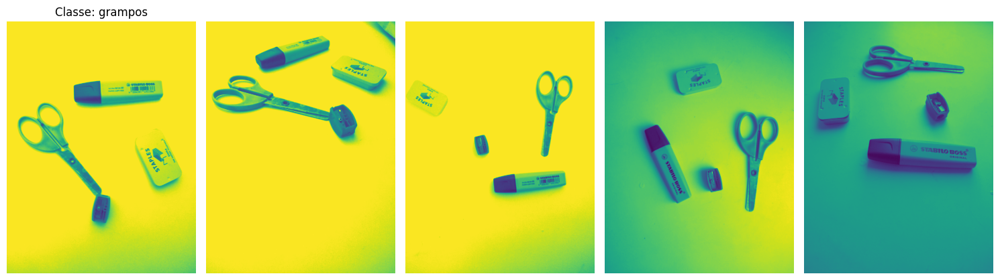

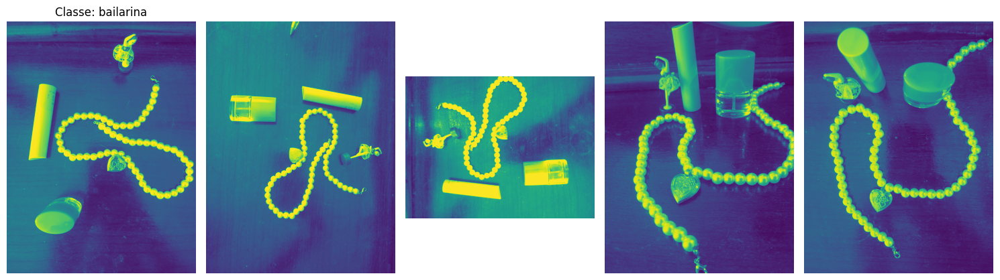

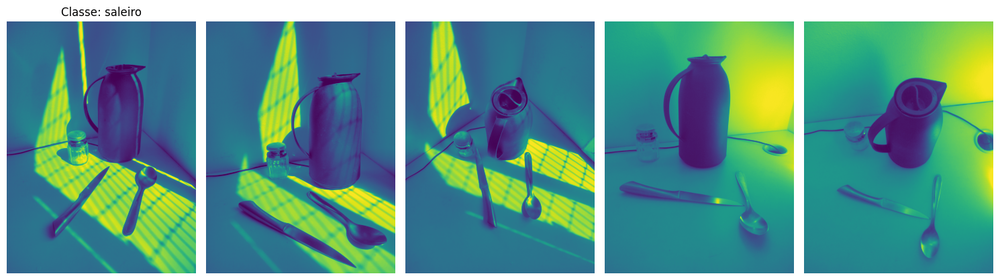

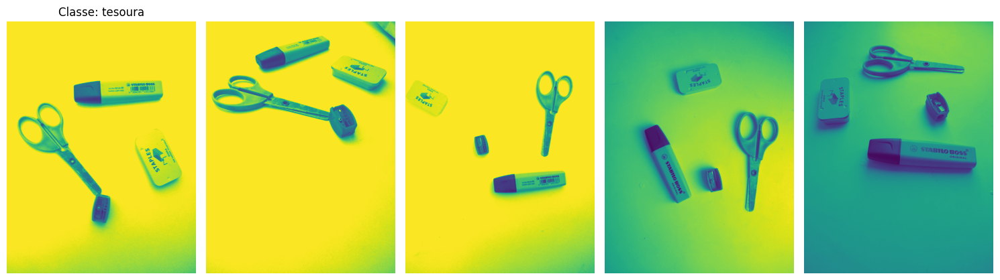

Voltou para o diretório original: /content/EP1/originalGrayDataSet


In [29]:
visualize_dataset(gray_dataset_dir)

In [30]:
gray_image_files = [f for f in os.listdir() if f.endswith('.jpg')]

In [15]:
os.chdir('..')

In [31]:
augmentation_funcs = [contrast_stretching, log_transformation, exponential_transformation, laplacian, mean_filter]
augmentation_prefixes = ['contrast_', 'log_', 'exp_', 'laplacian_', 'meanfilter_']

# Diretórios e arquivos
grayscale_dir = "/content/EP1/grayscaleDataSet"
augmentation_dir = "/content/EP1/augmentationDataSet"
grayscale_csv_path = os.path.join(grayscale_dir, 'grayscaleDataSet.csv')
augmentation_csv_path = os.path.join(augmentation_dir, 'augmentationDataSet.csv')





# DataFrame para armazenar os dados augmentados
augmentation_data = []


In [32]:
os.listdir()

['grayscale_095.jpg',
 'grayscale_043.jpg',
 'grayscale_036.jpg',
 'grayscale_059.jpg',
 'grayscale_019.jpg',
 'grayscale_045.jpg',
 'grayscale_070.jpg',
 'grayscale_099.jpg',
 'grayscale_046.jpg',
 'grayscale_102.jpg',
 'grayscale_049.jpg',
 'grayscale_064.jpg',
 'grayscale_054.jpg',
 'grayscale_082.jpg',
 'grayscale_042.jpg',
 'grayscale_078.jpg',
 'grayscale_074.jpg',
 'grayscale_081.jpg',
 'grayscale_008.jpg',
 'grayscale_075.jpg',
 'grayscale_024.jpg',
 'grayscale_104.jpg',
 'grayscale_048.jpg',
 'grayscale_071.jpg',
 'grayscale_083.jpg',
 'grayscale_002.jpg',
 'grayscale_004.jpg',
 'grayscale_097.jpg',
 'grayscale_014.jpg',
 'grayscale_087.jpg',
 'grayscale_107.jpg',
 'grayscale_040.jpg',
 'grayscale_094.jpg',
 'grayscale_013.jpg',
 'grayscale_077.jpg',
 'grayscale_056.jpg',
 'grayscale_018.jpg',
 'grayscale_029.jpg',
 'grayscale_027.jpg',
 'grayscale_079.jpg',
 'grayscale_044.jpg',
 'grayscale_051.jpg',
 'grayscale_007.jpg',
 'grayscale_065.jpg',
 'grayscale_012.jpg',
 'grayscal

FileNotFoundError: [Errno 2] No such file or directory: 'originalGrayDataSet'

Para cada imagem no Gray DataSet, vamos aplicar as funções de augmentation e salvar os dados em um novo csv.

In [33]:

for image_file in gray_image_files:
    img = cv2.imread(image_file, cv2.IMREAD_GRAYSCALE)




    row = dfgray[dfgray['filename'] == image_file]


    # Aplicar funções de augmentation
    for func, prefix in zip(augmentation_funcs, augmentation_prefixes):
        if func in [log_transformation, exponential_transformation]:
            iluminacao = row['iluminação'].values[0]

            if iluminacao in ['dia-claro', 'dia-sol', 'claro']:
              if func in [log_transformation]:
                aug_img = func(img, 2)
              else:
                aug_img = func(img, 1, 0.5)

            elif iluminacao in ['dia-escuro', 'dia-sombra']:
              if func in [log_transformation]:
                aug_img = func(img, 3)
              else:
                aug_img = func(img, 1.2, 0.7)

            elif iluminacao in ['noite-claro', 'luzartificial']:
              if func in [log_transformation]:
                aug_img = func(img, 4)
              else:
                aug_img = func(img, 1.5, 0.8)

            elif iluminacao in ['estourado']:
              if func in [log_transformation]:
                aug_img = func(img, 1)
              else:
                aug_img = func(img, 0.8, 0.3)

            elif iluminacao in ['noite-escuro', 'escuro']:
              if func in [log_transformation]:
                aug_img = func(img, 5)
              else:
                aug_img = func(img, 2, 1.2)

            else:
              continue
    else:
      aug_img = func(img)

    aug_filename = f"{prefix}{image_file}"
    aug_img_path = os.path.join(augmentation_dir, aug_filename)
    cv2.imwrite(aug_img_path, aug_img)

    # Criar nova entrada para o CSV
    new_row = row.copy()
    new_row['filename'] = aug_filename
    augmentation_data.append(new_row)

# Criar DataFrame para os dados augmentados e salvar como CSV
os.chdir('..')

augmentation_df = pd.concat(augmentation_data, ignore_index=True)
augmentation_df.to_csv(augmentation_csv_path, index=False)

print(f"Augmentation concluída. CSV salvo em {augmentation_csv_path}")





















Augmentation concluída. CSV salvo em /content/EP1/augmentationDataSet/augmentationDataSet.csv


Diretório atual antes de mudar: /content/EP1
Caminho completo do dataset: /content/EP1/augmentationDataSet
Diretório mudado para: /content/EP1/augmentationDataSet
Caminho do arquivo CSV: augmentationDataSet.csv


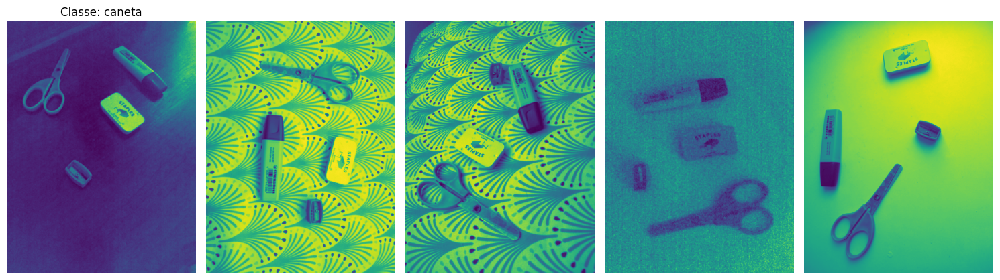

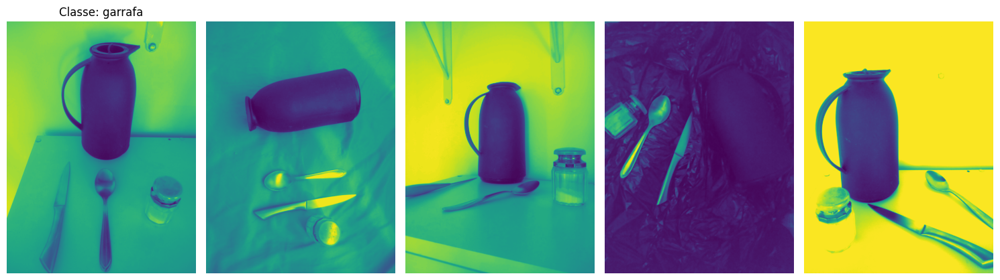

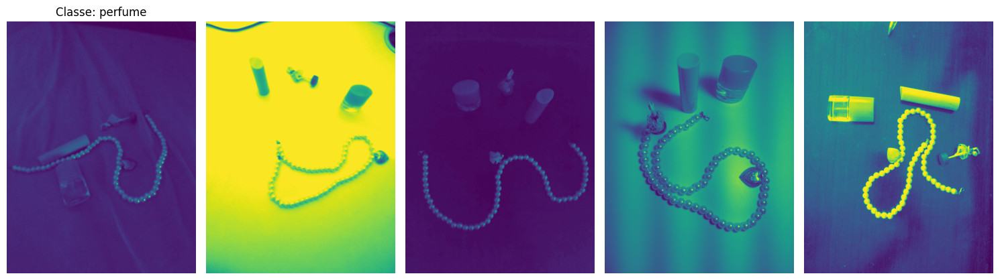

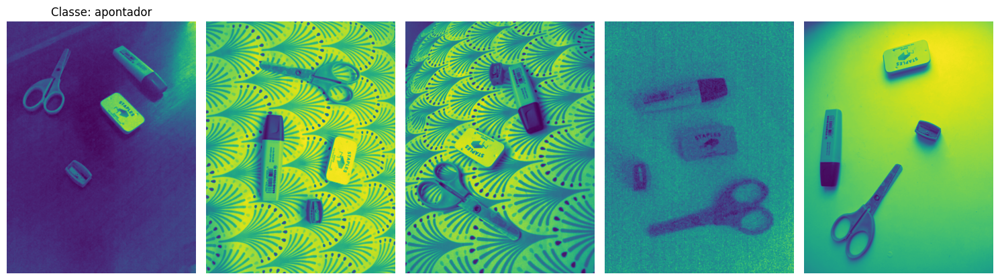

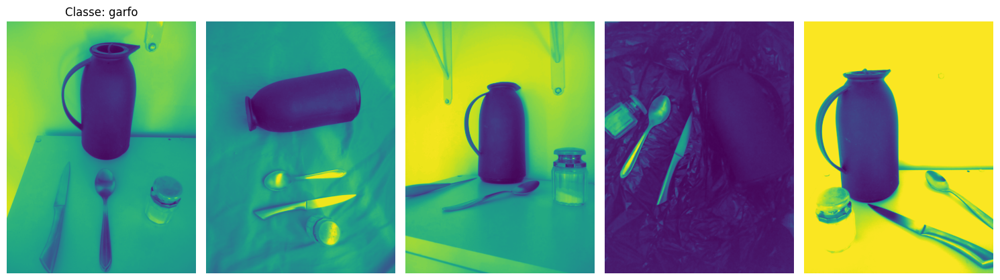

...

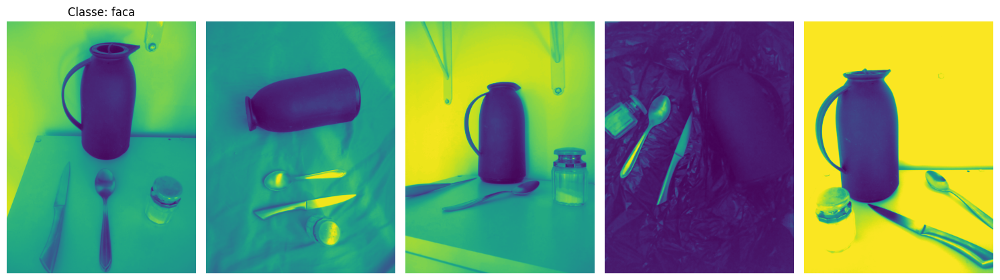

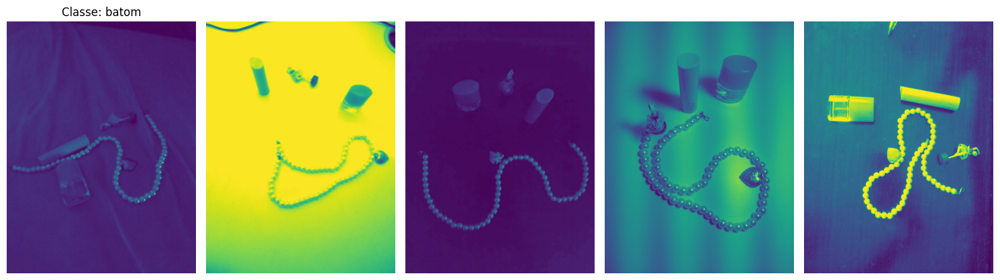

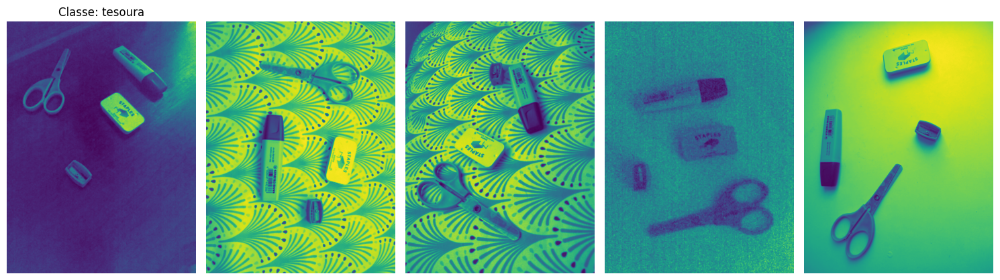

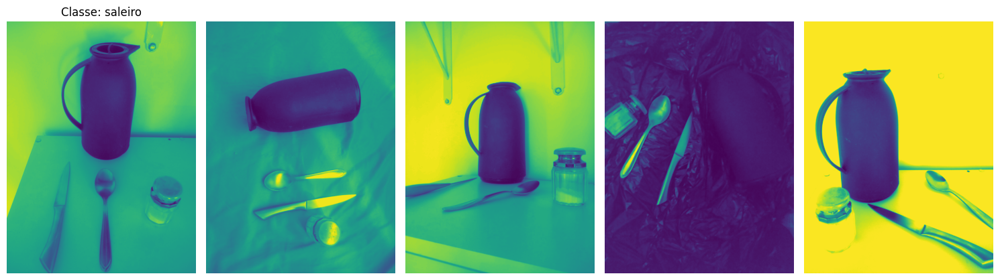

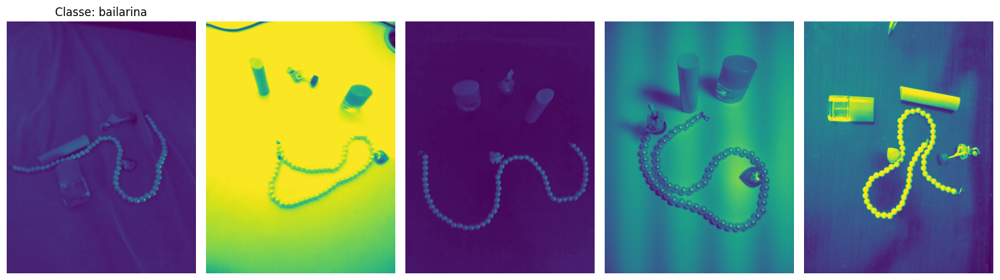

Voltou para o diretório original: /content/EP1


In [34]:
visualize_dataset(augm_dataset_dir)